In [1]:
import pandas as pd
from RoutePlanner.CellGrid import CellGrid
from RoutePlanner.IO import LoadIcePoints, LoadCurrentPoints
from RoutePlanner.Optimisation import TravelTime
from RoutePlanner.Plot import InteractiveMap, PlotMesh, PlotPaths

In [2]:
OptInfo = {}
X     = [230,360]
Y     = [-80,-40]
d     = [5,2.5]
OptInfo['Start Time']           = '2017-03-15'
OptInfo['End Time']             = '2017-03-16'
OptInfo['WayPoints']            = '../../resources/WayPoints.csv'
OptInfo['MaxIceExtent']         = 0.8
OptInfo['Zero Currents']        = False
OptInfo['VariableSpeed']        = False
OptInfo['Time Unit']            = 'days'
OptInfo['VehicleInfo']          = {}
OptInfo['VehicleInfo']['Speed'] = 26.3
OptInfo['VehicleInfo']['Unit']  = 'km/hr'

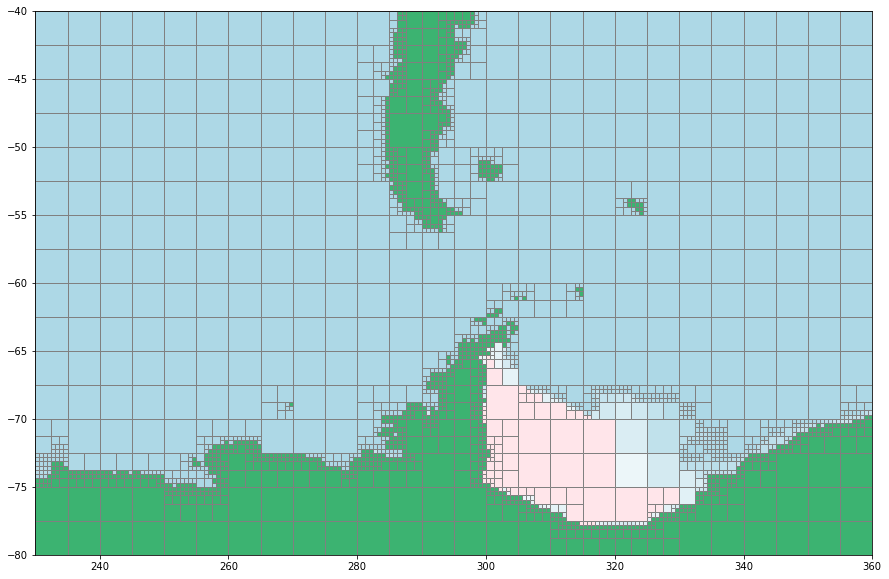

In [3]:
icePoints     = LoadIcePoints('../../Data/bsose_i122_2013to2017_1day_SeaIceArea.nc',OptInfo['Start Time'],OptInfo['End Time'])
currentPoints = LoadCurrentPoints('../../Data/SOSE_surface_velocity_6yearMean_2005-2010.nc')

cellGrid = CellGrid(X[0],X[1],Y[0],Y[1],d[0],d[1])
cellGrid.addIcePoints(icePoints)
cellGrid.addCurrentPoints(currentPoints)
cellGrid.recursiveSplit(3)
PlotMesh(cellGrid)

=== Processing Waypoint = LongPathEnd ===


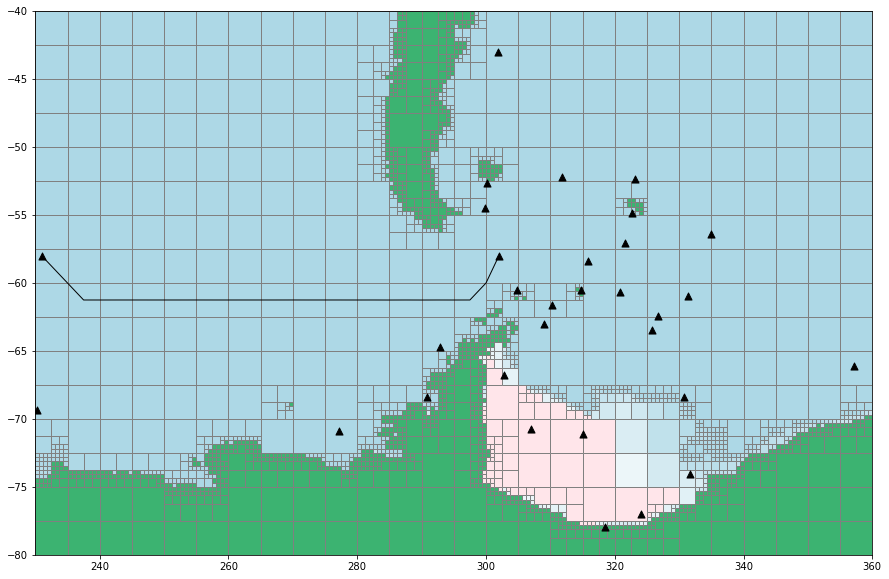

In [4]:
TT = TravelTime(cellGrid,OptInfo)
Paths = TT.Paths(source_waypoints=['LongPathEnd'],verbrose=True,end_waypoints=['LongPathStart'])
PlotPaths(cellGrid,Paths,routepoints=False,Waypoints=TT.OptInfo['WayPoints'])

In [5]:
m = InteractiveMap(cellGrid,Paths,pd.read_csv('../../resources/WayPoints.csv'),SitesOfInterest=pd.read_csv('../../resources/BAS_Stations.csv'),SDA='/Users/jsmith/Documents/Research/Researcher_BAS/RoutePlanning/SDADT-Positions')
m

In [6]:
SmoothedPaths = TT.PathSmoothing(Paths,maxiter=100, minimumDiff=0.001)

 PATH: LongPathEnd -> LongPathStart 
22 iterations to convergence


In [7]:
from RoutePlanner.IO import GreatCircle
import folium
import copy

WayPoints = pd.read_csv('../../resources/WayPoints.csv')

sm = InteractiveMap(cellGrid,SmoothedPaths,WayPoints,PathPoints=True,SitesOfInterest=pd.read_csv('../../resources/BAS_Stations.csv'),SDA='/Users/jsmith/Documents/Research/Researcher_BAS/RoutePlanning/SDADT-Positions')


Start_p = (WayPoints[WayPoints['Name']=='LongPathStart']['Long'],WayPoints[WayPoints['Name']=='LongPathStart']['Lat'])
End_p = (WayPoints[WayPoints['Name']=='LongPathEnd']['Long'],WayPoints[WayPoints['Name']=='LongPathEnd']['Lat'])

points = GreatCircle(Start_p,End_p)
points[:,0] = points[:,0]-360
points = points[:,::-1]
folium.PolyLine(points,color="red", weight=2.5, opacity=1).add_to(sm)


points = copy.deepcopy(Paths[0]['Path']['Points'])
points[:,0] = points[:,0]-360
points = points[:,::-1]
folium.PolyLine(points,color="blue", weight=2.5, opacity=1).add_to(sm)

sm

In [8]:
sm = InteractiveMap(cellGrid,SmoothedPaths,pd.read_csv('../../resources/WayPoints.csv'),PathPoints=False,SitesOfInterest=pd.read_csv('../../resources/BAS_Stations.csv'),SDA='/Users/jsmith/Documents/Research/Researcher_BAS/RoutePlanning/SDADT-Positions')
sm